In [29]:
#%pip install regex
#%pip install textacy
#%pip install nltk
#%pip install wordcloud
#%pip install matplot lib
#%pip install scikit-learn
#%pip install tqdm

In [2]:
import pandas as pd
import numpy as np
from os import walk
import sklearn

import regex #used for tokenization
import nltk #used for stop words
nltk.download('stopwords')

from collections import Counter #for word counts

#visualization tools
from wordcloud import WordCloud
from matplotlib import pyplot as plt
from textacy import extract #textacy is a NLP library built to work with spaCy; key word in context - pulls surrounding text for a keyword

import random

import re #standard library re for regular expressions; library regex that offers support for POSIX character classes and more flexibility
import html
import textacy.preprocessing as trep #normalizing

#topic modeling
from sklearn.feature_extraction.text import TfidfVectorizer
from spacy.lang.en.stop_words import STOP_WORDS as stopwords
from sklearn.decomposition import NMF
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from tqdm import tqdm

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/karenguzman/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
#reading in data
import os
mypath = './ML_Syllabi/txt_files'
print(mypath)

if os.path.exists(mypath):
    print("Directory exists!")
    print(os.listdir(mypath))  # List files
else:
    print("Directory does not exist!")
files = next(walk(mypath), (None, None, []))[2]

./ML_Syllabi/txt_files
Directory exists!
['BU_21F.txt', 'Stanford_23F.txt', 'UNM_23F.txt', 'UoM_24F.txt', 'GWU_22Sp.txt', 'UMassAmherst_2020Sp.txt', 'RIT_22F.txt', 'ASU_23F.txt', 'GTech_21Sp.txt', 'UTEP_24Sp.txt', 'NYUParis_24F.txt', 'Cornell_24Sp.txt', 'NJIT_24Sp.txt', 'OSU.txt', 'UFlorida_22Sp.txt', 'UArk_21F.txt', 'UMassAmherst_22Sp.txt', 'DU_18Sp.txt', 'USC_22F.txt', 'RIT_24F.txt', 'CarnegieMellon_24Su.txt', 'Rice_Sp23.txt', 'NJIT24Sp.txt', 'Harvard_24Sp.txt', 'UW_24Sp.txt', 'USC_19F.txt', 'USC_23Sp.txt', 'UNM_F.txt', 'GTech_Sp24.txt', 'UMich_F24.txt', 'UArizona_24F.txt', 'SJSU_F24.txt', 'Tufts_23F.txt']


In [13]:
#remove .txt from file names to get syllabus names

syll_names = [file[:-4] for file in files]
syll_names = [file for file in syll_names if file is not None]
print(syll_names)

['BU_21F', 'Stanford_23F', 'UNM_23F', 'UoM_24F', 'GWU_22Sp', 'UMassAmherst_2020Sp', 'RIT_22F', 'ASU_23F', 'GTech_21Sp', 'UTEP_24Sp', 'NYUParis_24F', 'Cornell_24Sp', 'NJIT_24Sp', 'OSU', 'UFlorida_22Sp', 'UArk_21F', 'UMassAmherst_22Sp', 'DU_18Sp', 'USC_22F', 'RIT_24F', 'CarnegieMellon_24Su', 'Rice_Sp23', 'NJIT24Sp', 'Harvard_24Sp', 'UW_24Sp', 'USC_19F', 'USC_23Sp', 'UNM_F', 'GTech_Sp24', 'UMich_F24', 'UArizona_24F', 'SJSU_F24', 'Tufts_23F']


In [14]:
corpus = pd.DataFrame()

#read in text from each file - save to corpus df along with syllabus name
for file in files:
  path = mypath+"//"+file
  with open(path, encoding='latin-1') as f:
    #print(chardet.detect(f.read())['encoding'])
    line = f.read() #.decode(chardet.detect(f.read())['encoding'])

    temp = pd.DataFrame({"name":syll_names[files.index(file)], "text":line}, index = [0])
    corpus = pd.concat([corpus, temp])
    f.close()
corpus = corpus.reset_index(drop=True)

In [15]:
#add length field to df
print(corpus.columns)
print(corpus.head())
corpus['length'] = corpus['text'].str.len()

Index(['name', 'text'], dtype='object')
           name                                               text
0        BU_21F  CSE4/574: Introduction to Machine Learning\nFa...
1  Stanford_23F  Date\nLecture Topics\nDeliverables\nNotes\nSli...
2       UNM_23F  Go to Main Content\n \nLoboWeb\n10-02-2024 09:...
3       UoM_24F  COMP 4745/6745 Machine Learning\nFall 2024\nAd...
4      GWU_22Sp  GWU\nCS 4364/6364\nIntroduction to Machine Lea...


<Axes: title={'center': 'Length of Syllabi'}>

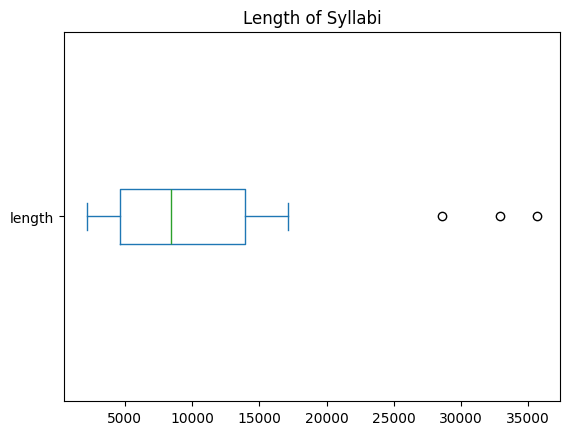

In [16]:
corpus['length'].plot(kind='box', vert=False, title="Length of Syllabi")

<Axes: title={'center': 'Distribution of Length of Syllabi'}, ylabel='Frequency'>

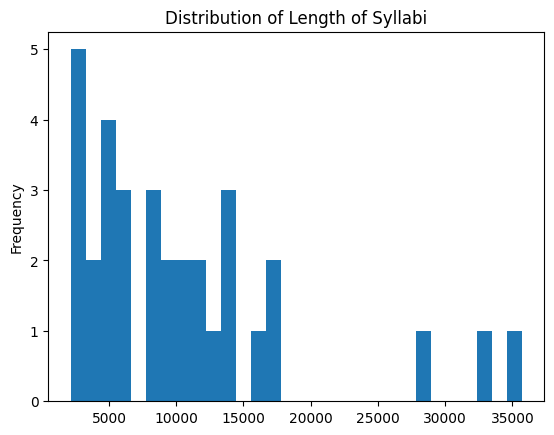

In [17]:
corpus['length'].plot(kind='hist', bins=30, title="Distribution of Length of Syllabi")

In [18]:
def tokenize(text):
  return regex.findall(r'[\w]*\p{L}[\w]*', text)

In [19]:
stopwords = set(nltk.corpus.stopwords.words('english'))

def remove_stop(tokens):
  return [t for t in tokens if t.lower() not in stopwords]

In [20]:
pipeline = [str.lower, tokenize, remove_stop]

def prepare(text, pipeline):
  tokens = str(text)
  for transform in pipeline:
    tokens = transform(tokens)
  return tokens

In [21]:
corpus['tokens'] = corpus['text'].apply(prepare, pipeline = pipeline)
corpus['num_tokens'] = corpus['tokens'].map(len)

In [22]:
def count_words(df, column='tokens', preprocess=None, min_freq=2):
  #proces tokens and update counter
  def update(doc):
    tokens = doc if preprocess is None else preprocess(doc)
    counter.update(tokens)
  #create counter and run through all data
  counter = Counter()

  if type(df) == pd.DataFrame:
    df[column].map(update)
  else:
    counter.update(df[column])

  #transform counter into a DataFrame
  freq_df = pd.DataFrame.from_dict(counter, orient='index', columns=['freq'])
  freq_df = freq_df.query('freq >= @min_freq')
  freq_df.index.name = 'token'

  return freq_df.sort_values('freq', ascending=False)

In [23]:
freq_df = count_words(corpus)

[Text(0.5, 0, 'Frequency'), Text(0, 0.5, 'Token'), Text(0.5, 1.0, 'Top Words')]

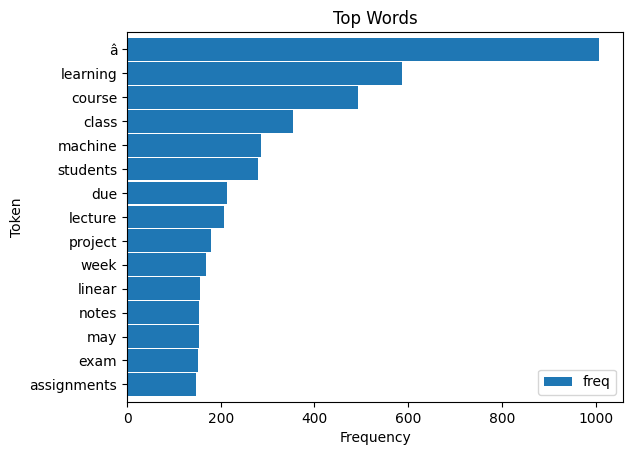

In [24]:
ax = freq_df.head(15).plot(kind='barh', width=0.95)
ax.invert_yaxis()
ax.set(xlabel='Frequency', ylabel='Token', title='Top Words')

In [25]:
def wordcloud(word_freq, save_plot = False, save_name = None, title=None, max_words=200, stopwords=None):

    wc = WordCloud(background_color="white", max_words=max_words,
                       width=960, height=540)

    # convert DataFrame into dict
    if type(word_freq) == pd.Series:
        counter = Counter(word_freq.fillna(0).to_dict())
    else:
        counter = word_freq

    # filter stop words in frequency counter
    if stopwords is not None:
        counter = {token:freq for (token, freq) in counter.items()
                              if token not in stopwords}
    wc.generate_from_frequencies(counter)
    plt.figure(figsize=(12,12))

    plt.title(title)

    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")

    if save_plot:
        plt.savefig(f'{save_name}.png')

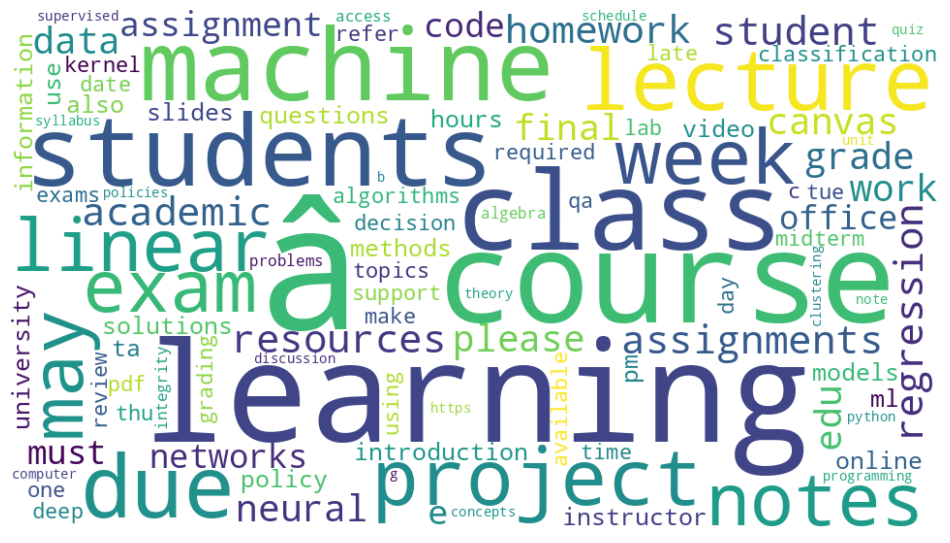

In [26]:
wordcloud(freq_df['freq'], max_words = 100)

BU_21F
Stanford_23F
UNM_23F
UoM_24F
GWU_22Sp
UMassAmherst_2020Sp
RIT_22F
ASU_23F
GTech_21Sp
UTEP_24Sp
NYUParis_24F
Cornell_24Sp
NJIT_24Sp
OSU
UFlorida_22Sp
UArk_21F
UMassAmherst_22Sp
DU_18Sp
USC_22F
RIT_24F
CarnegieMellon_24Su


/tmp/ipykernel_134253/4149831730.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12,12))


Rice_Sp23
NJIT24Sp
Harvard_24Sp
UW_24Sp
USC_19F
USC_23Sp
UNM_F
GTech_Sp24
UMich_F24
UArizona_24F
SJSU_F24
Tufts_23F


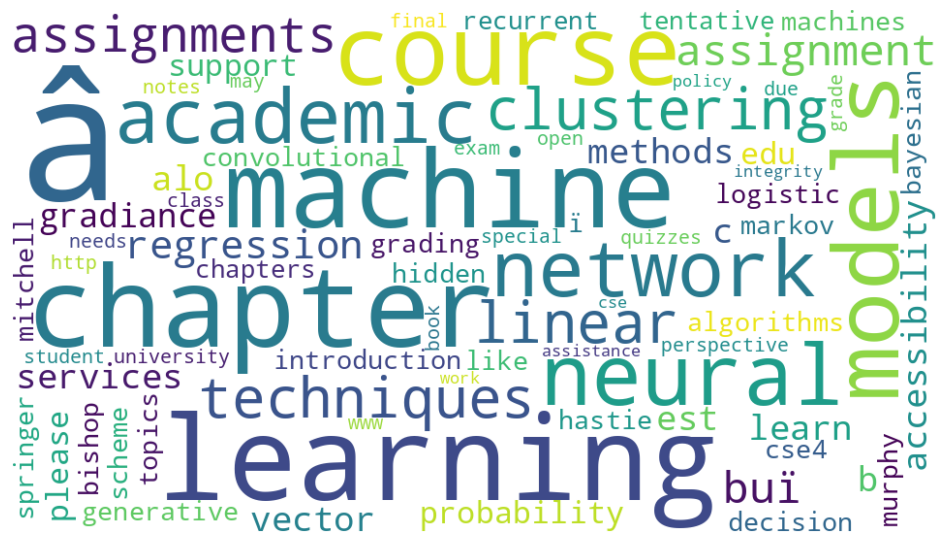

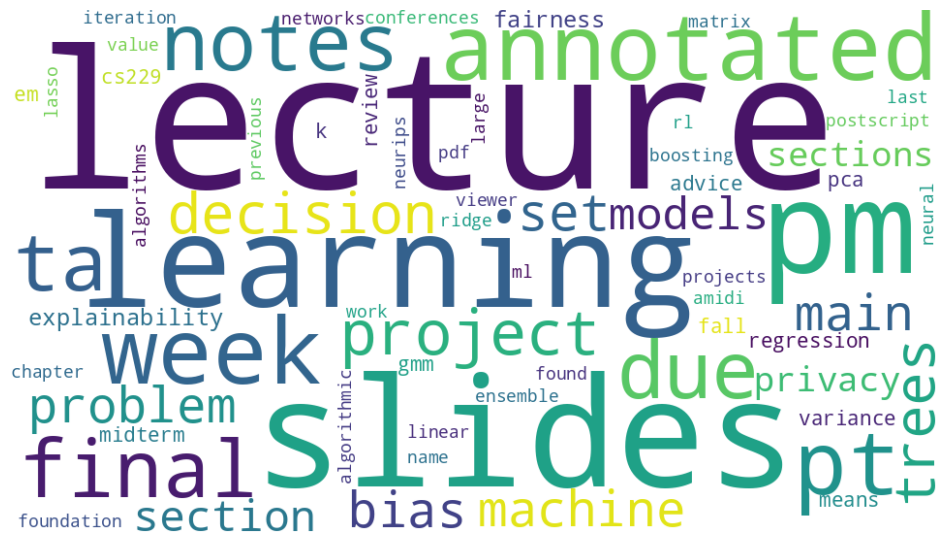

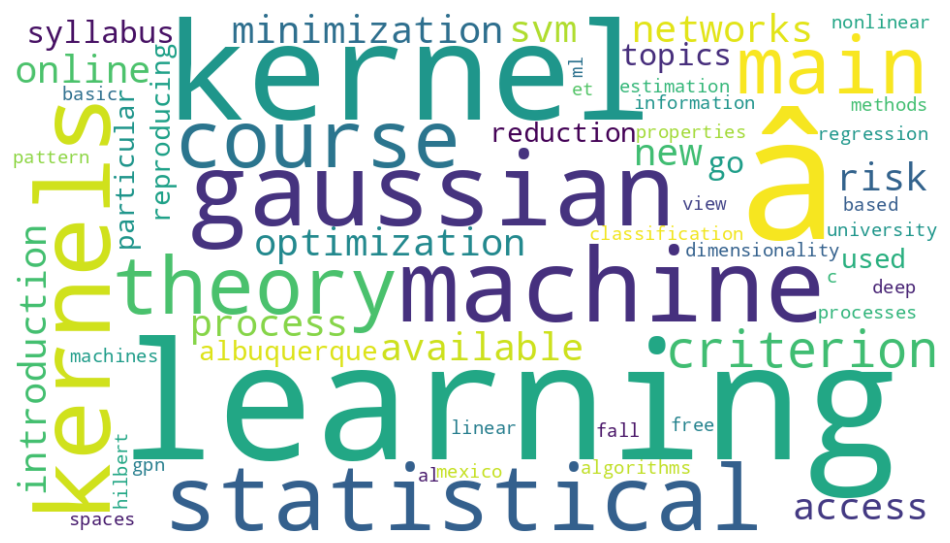

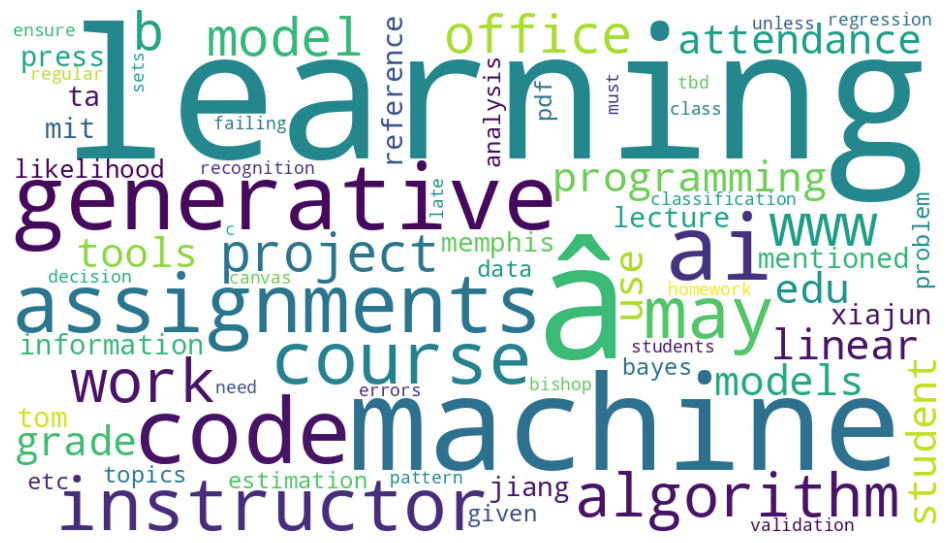

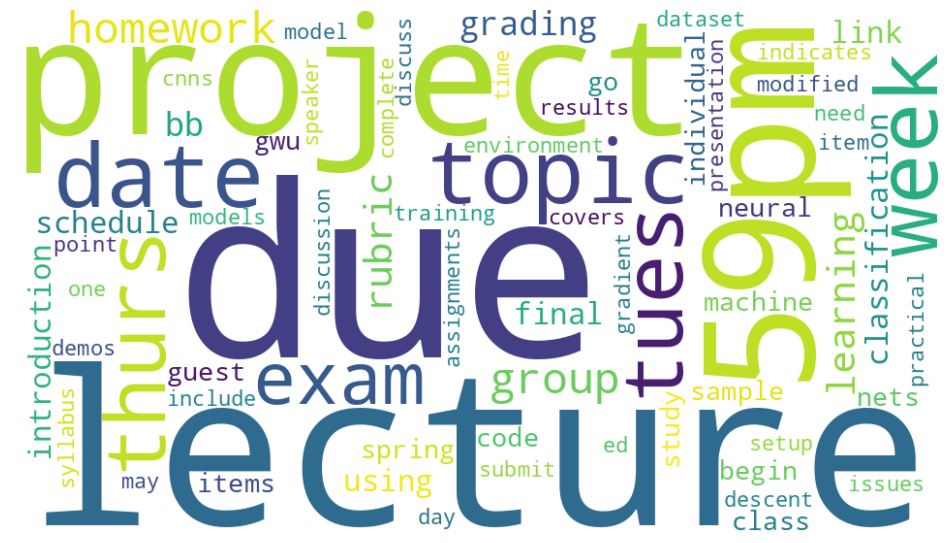

...

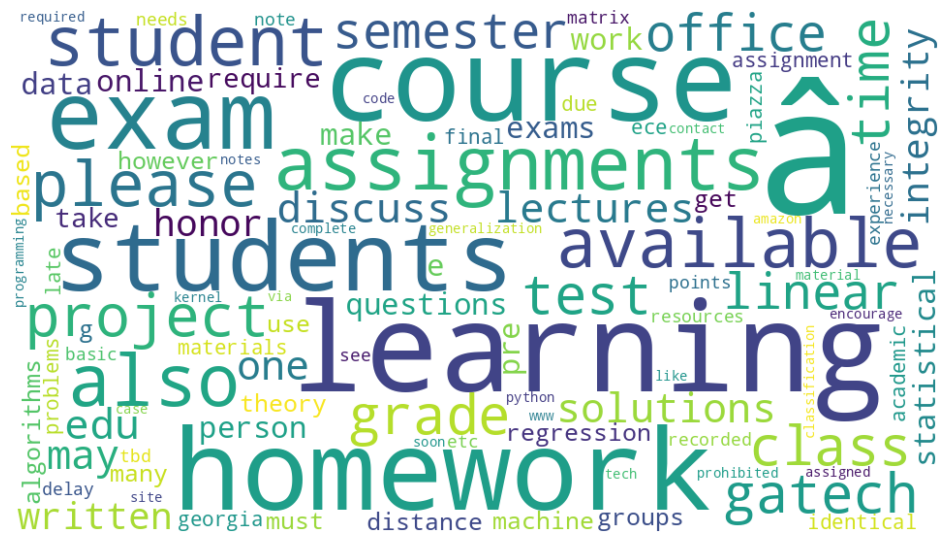

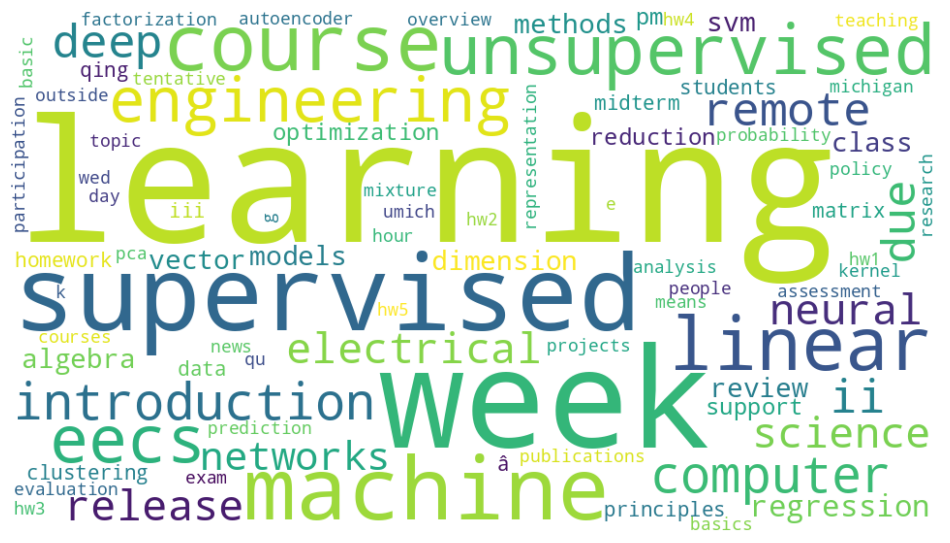

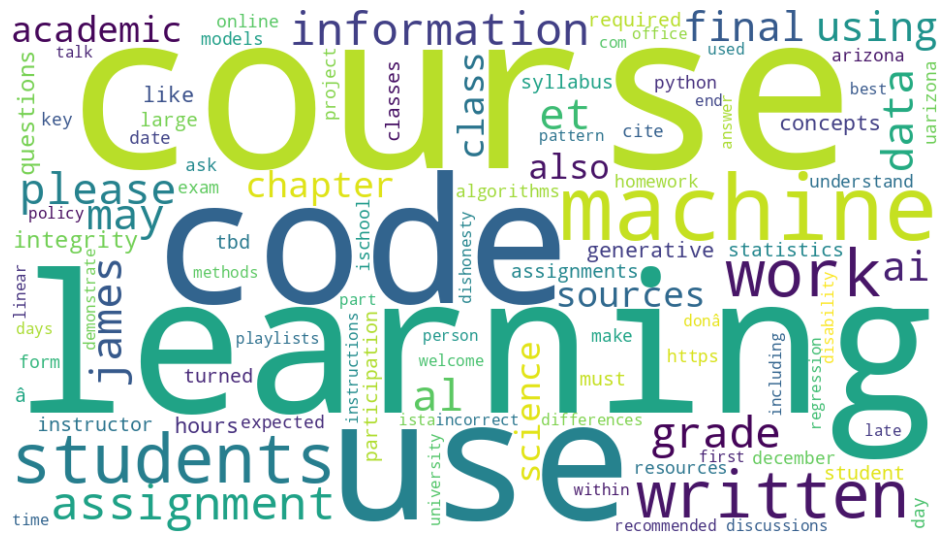

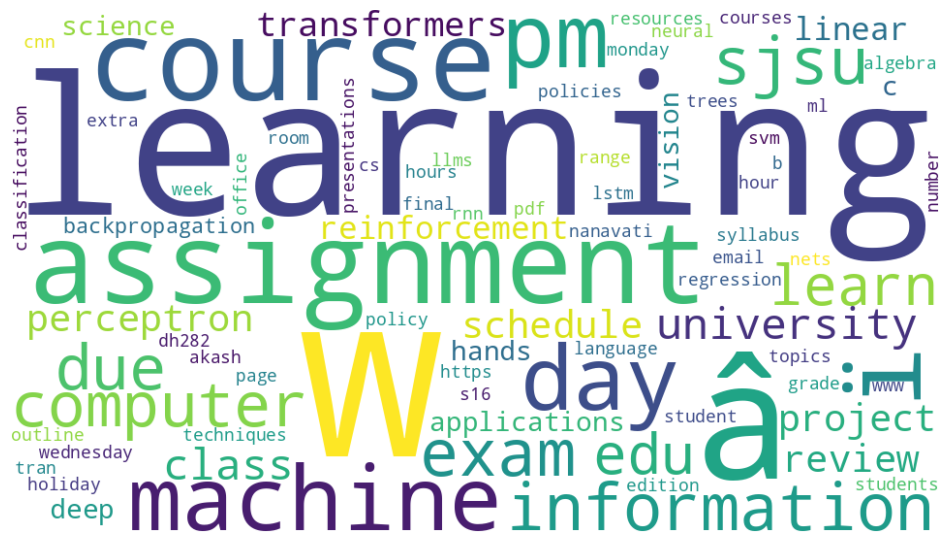

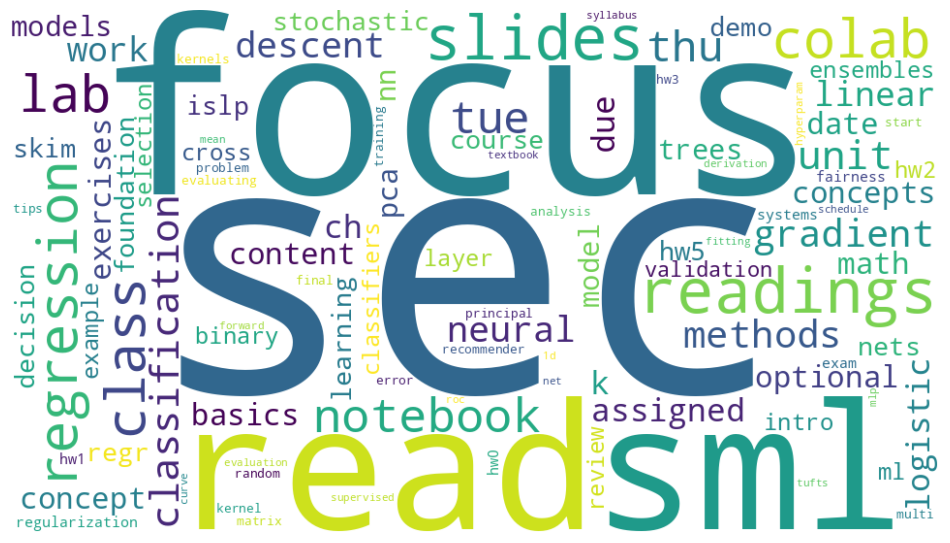

In [27]:
#individual schools
for index, rows in corpus.iterrows():
  print(corpus.iloc[index, 0])
  wordcloud(count_words(corpus.iloc[index,:])['freq'], max_words = 100)